# DNA damage cell image analysis

### Overview
- We hope quantify DNA damage signal distribution in heterochromatin and euchromatin(similar as MCM signls) 
- To save imaging time, we will image one slice instead of a Z stacks. And the image will be much bigger and including hundreds of cells instead of single cells. 
- One of challenges will be how can we give each of cell a name in the same image so that we can match them with their growth history


In [1]:
import pandas as pd
import numpy as np
from skimage.external import tifffile
from skimage.external.tifffile import imread

import matplotlib.pyplot as plt

import os
from os import listdir
from os.path import isfile, join


In [2]:
bigDir=r'Z:\CookLab\Liu\20190816_organizedData_MCM_loading\dna damage doodle'

In [3]:
cellFile=f'{bigDir}\\data_tiff\\20201030_xy25_tailscan.tif'
file_mask=f'{bigDir}\\segmentation_nucleus_Otsu\\20201030_xy25_tailscan_nucleus.tif'

img=imread(cellFile)
mask=imread(file_mask)
mask=mask.astype(bool)

dna=img[1,:,:]
dna[~mask]=0

<IPython.core.display.Javascript object>


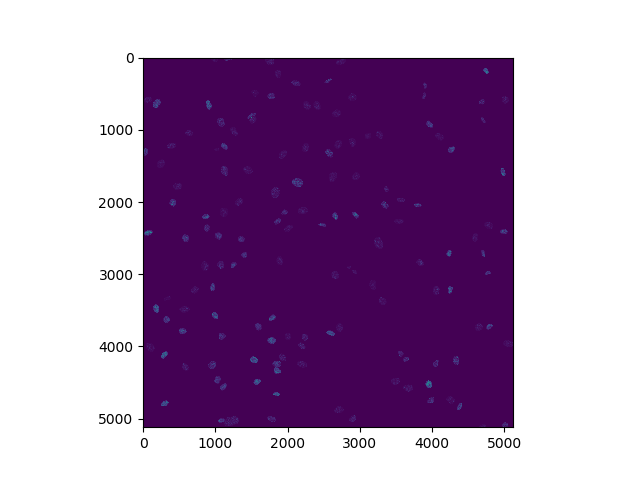

In [4]:
%matplotlib notebook
plt.imshow(img[1,:,:])

<IPython.core.display.Javascript object>


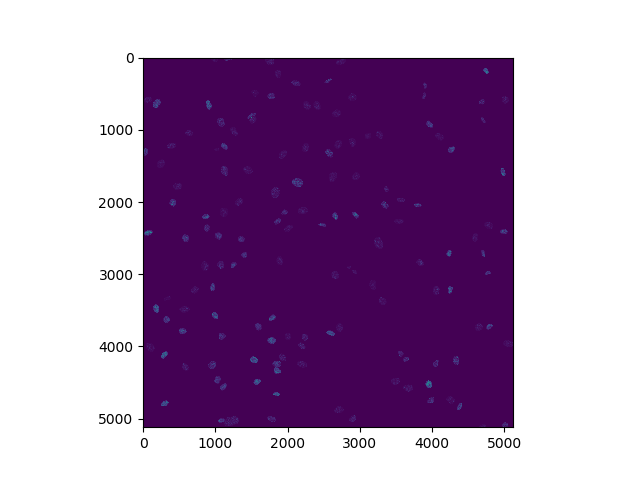

In [5]:
%matplotlib notebook
plt.imshow(dna)

<IPython.core.display.Javascript object>


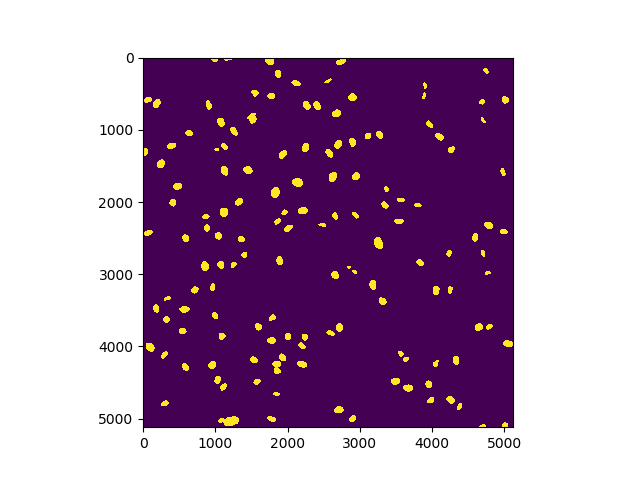

In [6]:
%matplotlib notebook
plt.imshow(mask)

## First attempt on making individual cell files

I found a code on skimage website where it detects the 'blobs' in the image. the 'blobs' in our case will be cells. This code tries three different methods and shows the results in the plot. Based on what we see in the plots, I concluded that using difference of Gaussian will give us the best results. [link to skimage website on blob detection](https://scikit-image.org/docs/dev/auto_examples/features_detection/plot_blob.html)

In [7]:
from math import sqrt
from skimage import data
from skimage.feature import blob_dog, blob_log, blob_doh
from skimage.color import rgb2gray

image_gray = rgb2gray(dna)

blobs_log = blob_log(image_gray, max_sigma=30, num_sigma=10, threshold=.1)

# Compute radii in the 3rd column.
blobs_log[:, 2] = blobs_log[:, 2] * sqrt(2)

blobs_dog = blob_dog(image_gray, max_sigma=30, threshold=.1)
blobs_dog[:, 2] = blobs_dog[:, 2] * sqrt(2)

blobs_doh = blob_doh(image_gray, max_sigma=30, threshold=.01)

blobs_list = [blobs_log, blobs_dog, blobs_doh]
colors = ['yellow', 'lime', 'red']
titles = ['Laplacian of Gaussian', 'Difference of Gaussian',
          'Determinant of Hessian']

<IPython.core.display.Javascript object>


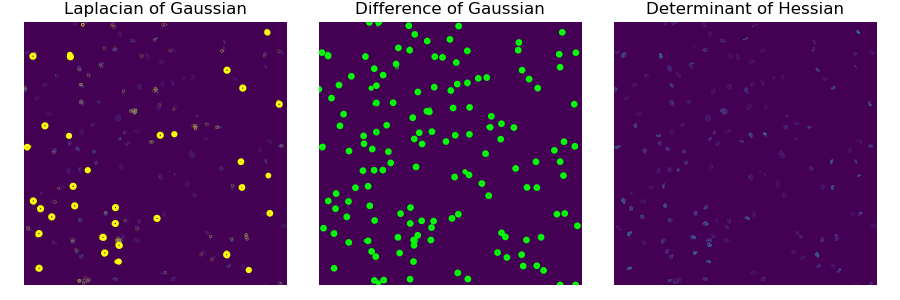

In [8]:
sequence = zip(blobs_list, colors, titles)

fig, axes = plt.subplots(1, 3, figsize=(9, 3), sharex=True, sharey=True)
ax = axes.ravel()

for idx, (blobs, color, title) in enumerate(sequence):
    ax[idx].set_title(title)
    ax[idx].imshow(dna)
    for blob in blobs:
        y,x,r=blob
        c = plt.Circle((x, y), r, color=color, linewidth=2, fill=False)
        ax[idx].add_patch(c)
    ax[idx].set_axis_off()

plt.tight_layout()
plt.show()

<IPython.core.display.Javascript object>


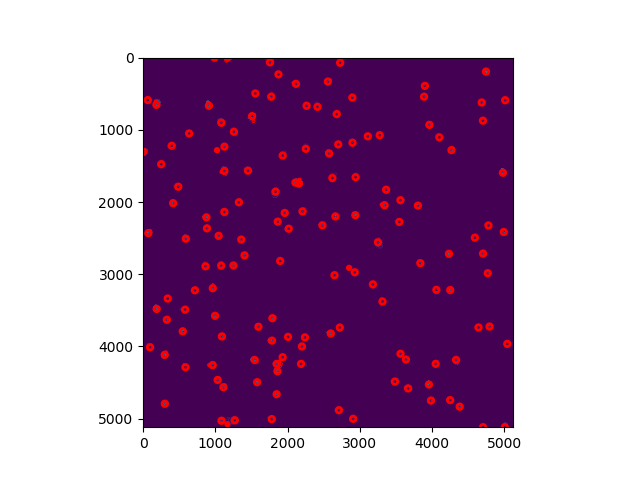

In [9]:
%matplotlib notebook
fig,ax=plt.subplots()
ax.imshow(dna)
for blob in blobs_dog:
    y,x,r=blob
    c = plt.Circle((x, y), r, color=color, linewidth=2, fill=False)
    ax.add_patch(c)
fig.show()

In [10]:
blobs_dog.shape

(159, 3)

### Note
After running the code for difference of Gaussian, I realized that there are small 'blobs' detected that were too small to be a cell or overlapped with another cell. In this first attempt, I did not consider any 'blobs' that had radius smaller than 5 pixels. This resulted in 155 indivudal cell files to be created. 

In [11]:
blobs_dogdf=pd.DataFrame(blobs_dog)

blobs_dogdf.head()

shape=dna.shape

for index,blob in blobs_dogdf.iterrows():
    y,x,r=blob
    if r < 5:
        print("small!")
    else:
        x=int(x)
        y=int(y)

        if x-100 < 0:
            x_lower=0
        else:
            x_lower = x-100

        if y-100<0:
            y_lower=0
        else:
            y_lower=y-100

        if x+100 > shape[0]:
            x_upper=shape[0]
        else:
            x_upper=x+100

        if y+100>shape[1]:
            y_upper=shape[1]
        else:
            y_upper=y+100

        result=dna[y_lower:y_upper,x_lower:x_upper]

        
        newSegFolder = os.path.dirname(cellFile).replace('data_tiff','ind_files')
        try:
            os.mkdir(newSegFolder)
        except:
            pass
        maskFile = os.path.basename(cellFile).replace('.tif',f'_{index}.tif')
        tifffile.imsave(os.path.join(newSegFolder,maskFile), result)
         

small!
small!
small!
small!


## second attempt

Took a closer look into the blobs that were detected using difference of Gaussian. Found out that majoriy of the blobs had radius bigger than 30. Considering the possible flaws of detection and cells detected overlapped, I decided to not consider the cells that had radius smailler than 20 pixels. 

In [12]:
radius=[]
for blob in blobs_dog:
    y,x,r=blob
    radius.append(r)

In [13]:
blobs_dogdf=pd.DataFrame(blobs_dog)
blobs_dogdf.columns = blobs_dogdf.columns.astype(str)
blobs_dogdf=blobs_dogdf.rename(columns={'0':'y','1':'x','2':'r'})

In [14]:
blobs_dogdf.head()

,y,x,r
0,5119.0,5009.0,37.962506
1,5119.0,4707.0,37.962506
2,5079.0,1167.0,23.726566
3,5030.0,1084.0,37.962506
4,5024.0,1268.0,37.962506


In [15]:
list(blobs_dogdf.columns)

['y', 'x', 'r']

In [16]:
import seaborn as sns

<IPython.core.display.Javascript object>


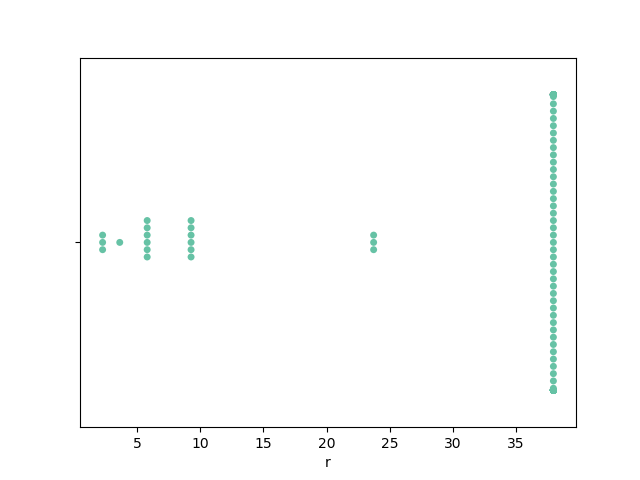

In [17]:
%matplotlib notebook
sns.swarmplot(x="r", data=blobs_dogdf,palette='Set2')
#sns.boxplot(x="r", data=blobs_dogdf,palette='Set2')

In [18]:
blobs_dogdf=pd.DataFrame(blobs_dog)

blobs_dogdf.head()

shape=dna.shape

for index,blob in blobs_dogdf.iterrows():
    y,x,r=blob
    if r < 20:
        print("small!")
    else:
        x=int(x)
        y=int(y)

        if x-100 < 0:
            x_lower=0
        else:
            x_lower = x-100

        if y-100<0:
            y_lower=0
        else:
            y_lower=y-100

        if x+100 > shape[0]:
            x_upper=shape[0]
        else:
            x_upper=x+100

        if y+100>shape[1]:
            y_upper=shape[1]
        else:
            y_upper=y+100

        result=dna[y_lower:y_upper,x_lower:x_upper]

        
        newSegFolder = os.path.dirname(cellFile).replace('data_tiff','ind_files2')
        try:
            os.mkdir(newSegFolder)
        except:
            pass
        maskFile = os.path.basename(cellFile).replace('.tif',f'_{index}.tif')
        tifffile.imsave(os.path.join(newSegFolder,maskFile), result)
         

small!
small!
small!
small!
small!
small!
small!
small!
small!
small!
small!
small!
small!
small!
small!
small!


<IPython.core.display.Javascript object>


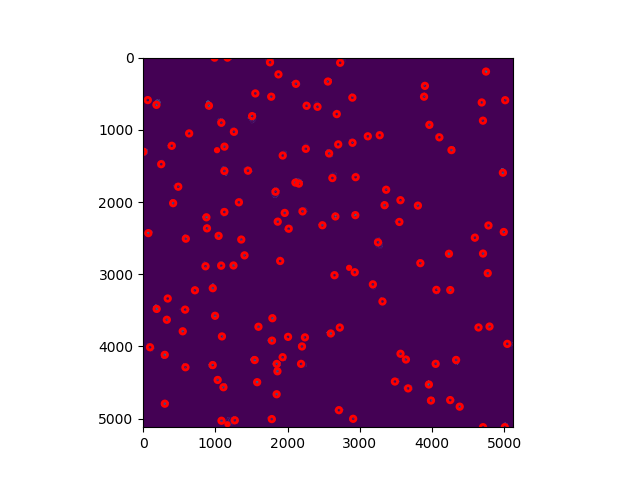

In [19]:
%matplotlib notebook
fig,ax=plt.subplots()
ax.imshow(dna)
for blob in blobs_dog:
    y,x,r=blob
    if r > 20:
        c = plt.Circle((x, y), r, color=color, linewidth=2, fill=False)
        ax.add_patch(c)
fig.show()

## Third attempt

In [20]:
blobs_dogdf=pd.DataFrame(blobs_dog)

blobs_dogdf.head()

shape=dna.shape

for index,blob in blobs_dogdf.iterrows():
    y,x,r=blob
    if r < 30:
        print("small!")
    else:
        x=int(x)
        y=int(y)

        if x-100 < 0:
            x_lower=0
        else:
            x_lower = x-100

        if y-100<0:
            y_lower=0
        else:
            y_lower=y-100

        if x+100 > shape[0]:
            x_upper=shape[0]
        else:
            x_upper=x+100

        if y+100>shape[1]:
            y_upper=shape[1]
        else:
            y_upper=y+100

        result=dna[y_lower:y_upper,x_lower:x_upper]

        
        newSegFolder = os.path.dirname(cellFile).replace('data_tiff','ind_files3')
        try:
            os.mkdir(newSegFolder)
        except:
            pass
        maskFile = os.path.basename(cellFile).replace('.tif',f'_{index}.tif')
        tifffile.imsave(os.path.join(newSegFolder,maskFile), result)
         

small!
small!
small!
small!
small!
small!
small!
small!
small!
small!
small!
small!
small!
small!
small!
small!
small!
small!
small!


In [21]:
path=r'Z:\CookLab\Liu\20190816_organizedData_MCM_loading\dna damage doodle\ind_files3'

In [22]:
from os import listdir
from os.path import isfile, join
onlyfiles = [f for f in listdir(path) if isfile(join(path, f))]

In [23]:
onlyfiles

['20201030_xy25_tailscan_0.tif',
 '20201030_xy25_tailscan_1.tif',
 '20201030_xy25_tailscan_10.tif',
 '20201030_xy25_tailscan_100.tif',
 '20201030_xy25_tailscan_101.tif',
 '20201030_xy25_tailscan_102.tif',
 '20201030_xy25_tailscan_103.tif',
 '20201030_xy25_tailscan_104.tif',
 '20201030_xy25_tailscan_105.tif',
 '20201030_xy25_tailscan_106.tif',
 '20201030_xy25_tailscan_108.tif',
 '20201030_xy25_tailscan_109.tif',
 '20201030_xy25_tailscan_11.tif',
 '20201030_xy25_tailscan_110.tif',
 '20201030_xy25_tailscan_112.tif',
 '20201030_xy25_tailscan_113.tif',
 '20201030_xy25_tailscan_114.tif',
 '20201030_xy25_tailscan_115.tif',
 '20201030_xy25_tailscan_116.tif',
 '20201030_xy25_tailscan_117.tif',
 '20201030_xy25_tailscan_119.tif',
 '20201030_xy25_tailscan_12.tif',
 '20201030_xy25_tailscan_120.tif',
 '20201030_xy25_tailscan_121.tif',
 '20201030_xy25_tailscan_122.tif',
 '20201030_xy25_tailscan_123.tif',
 '20201030_xy25_tailscan_124.tif',
 '20201030_xy25_tailscan_125.tif',
 '20201030_xy25_tailscan_12

<IPython.core.display.Javascript object>


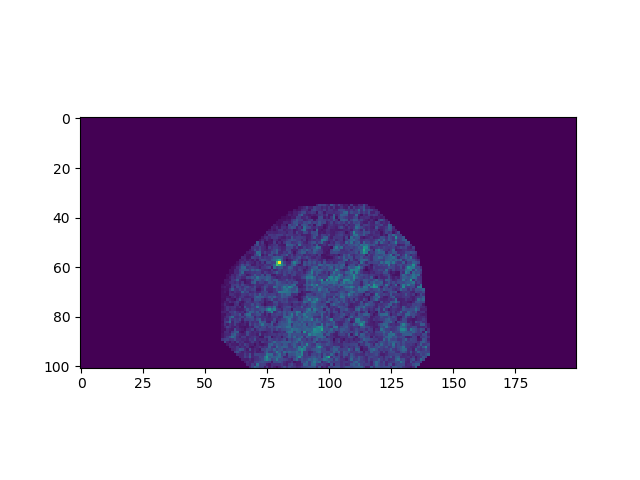

<IPython.core.display.Javascript object>


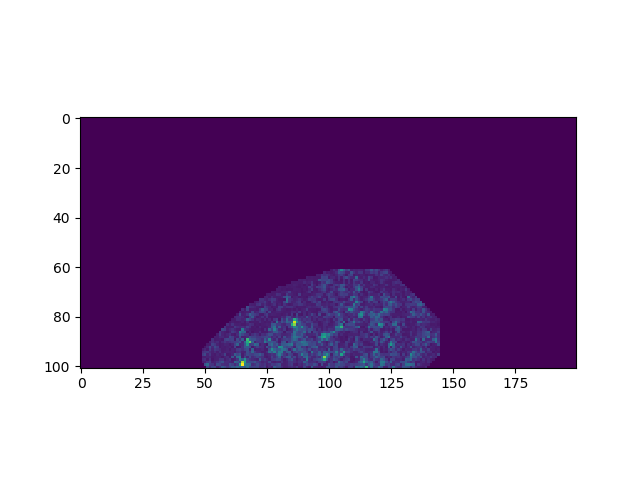

<IPython.core.display.Javascript object>


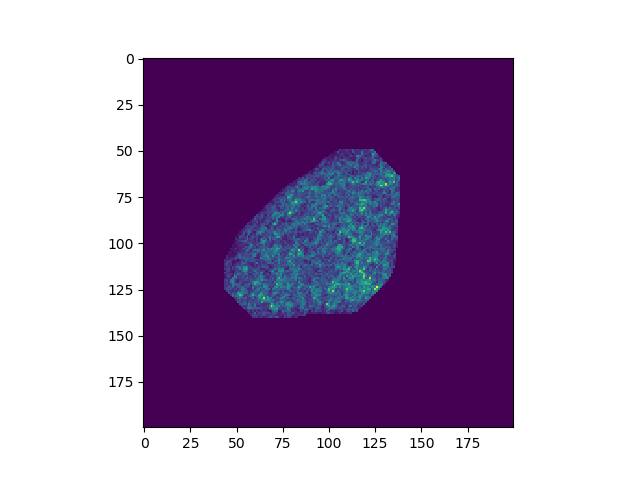

<IPython.core.display.Javascript object>


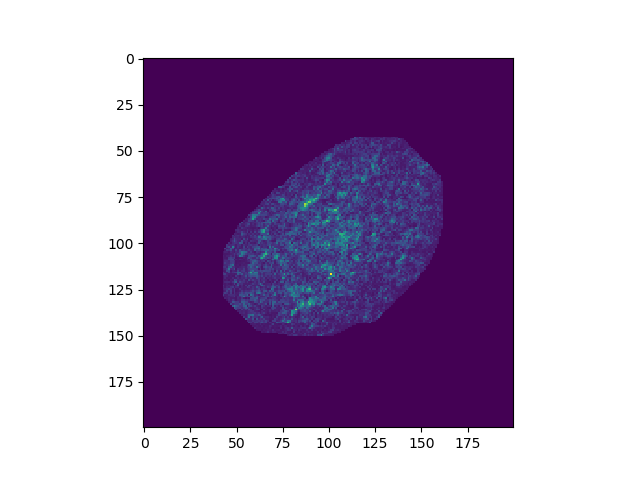

<IPython.core.display.Javascript object>


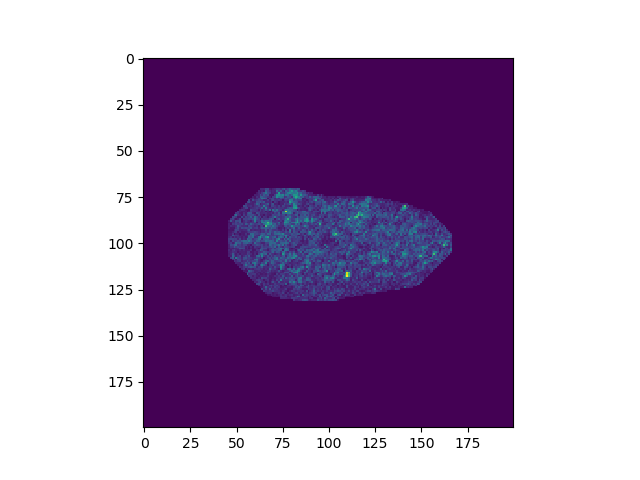

<IPython.core.display.Javascript object>


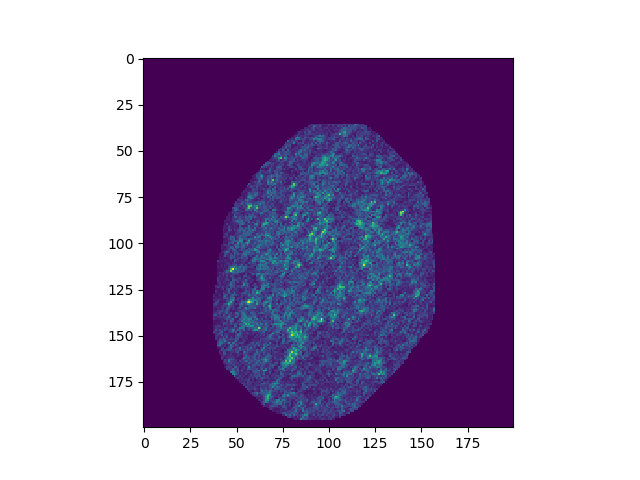

<IPython.core.display.Javascript object>


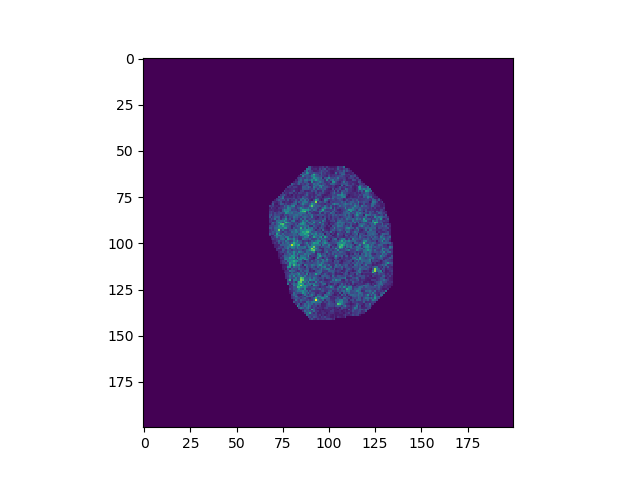

<IPython.core.display.Javascript object>


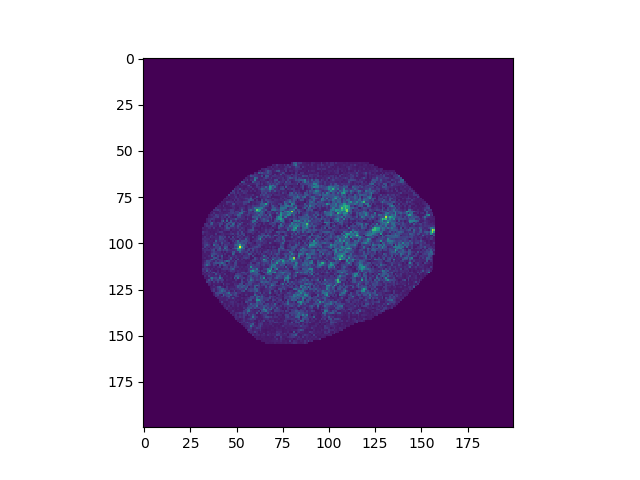

<IPython.core.display.Javascript object>


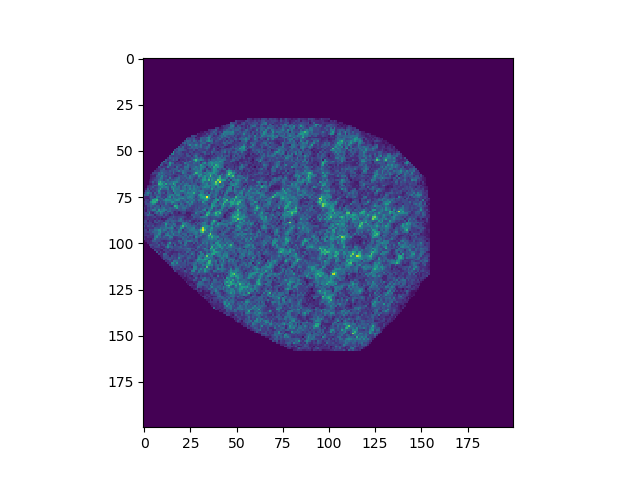

<IPython.core.display.Javascript object>


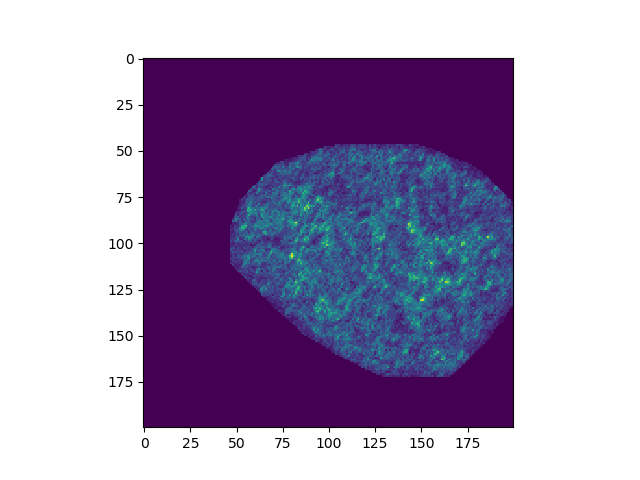

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


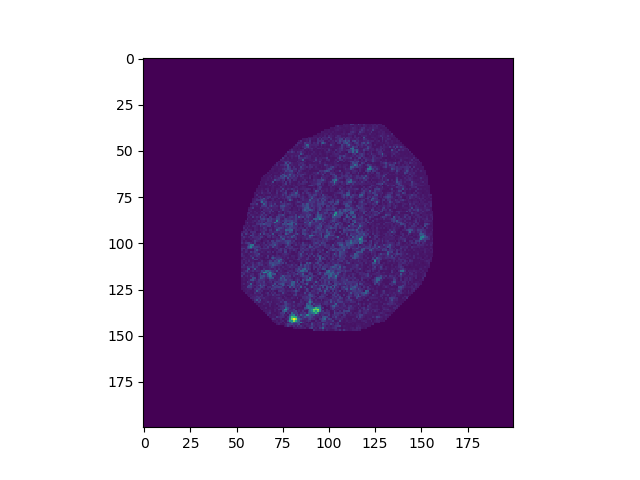

<IPython.core.display.Javascript object>


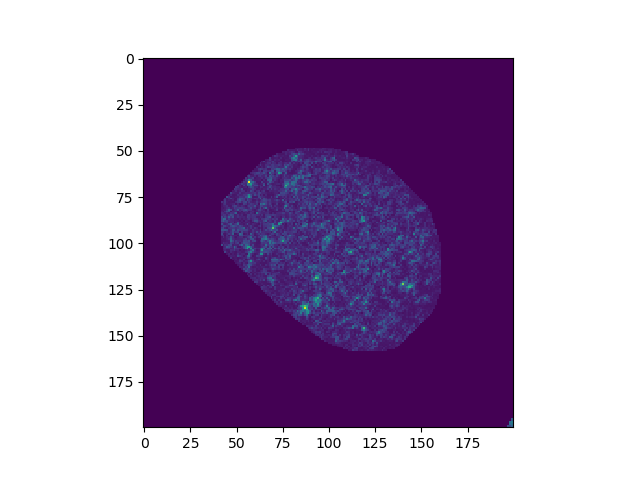

<IPython.core.display.Javascript object>


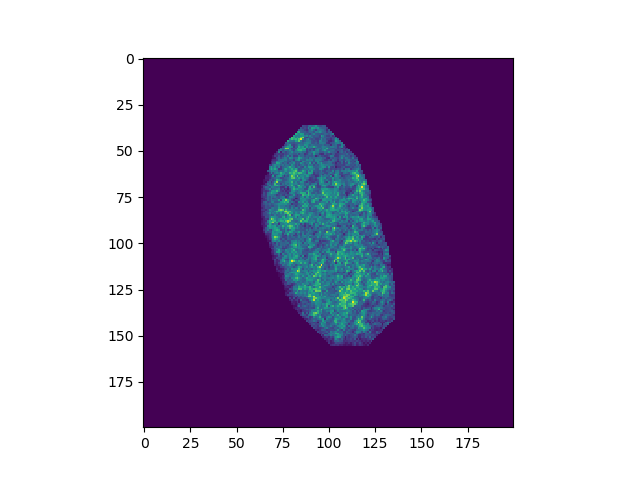

<IPython.core.display.Javascript object>


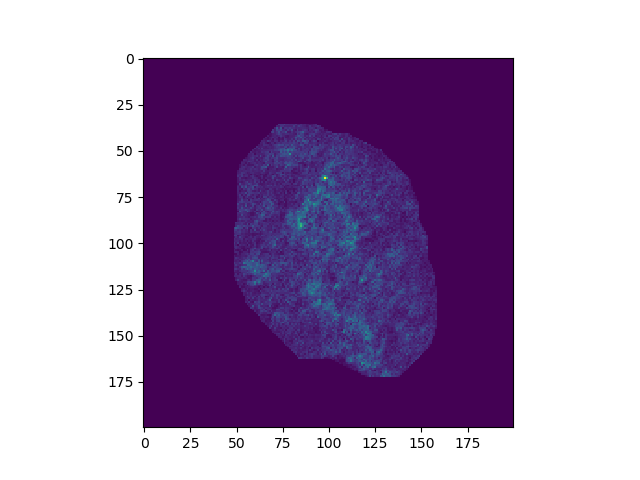

<IPython.core.display.Javascript object>


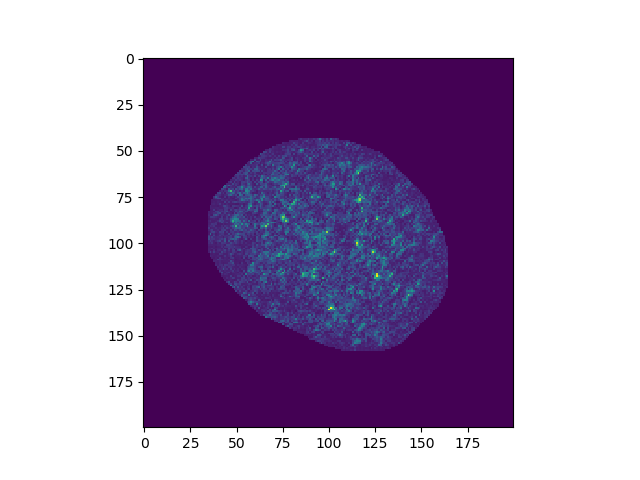

<IPython.core.display.Javascript object>


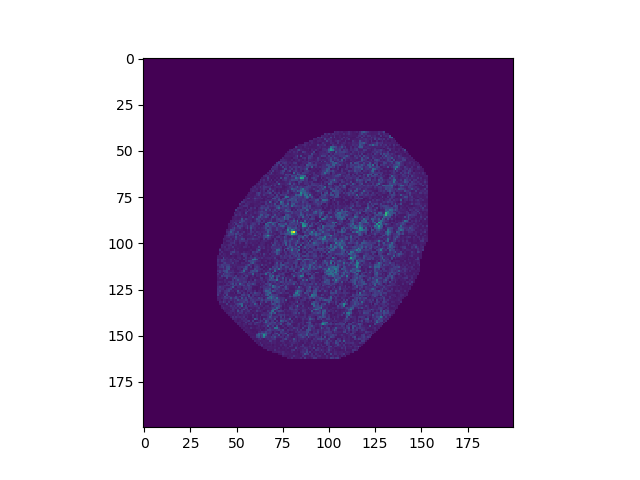

<IPython.core.display.Javascript object>


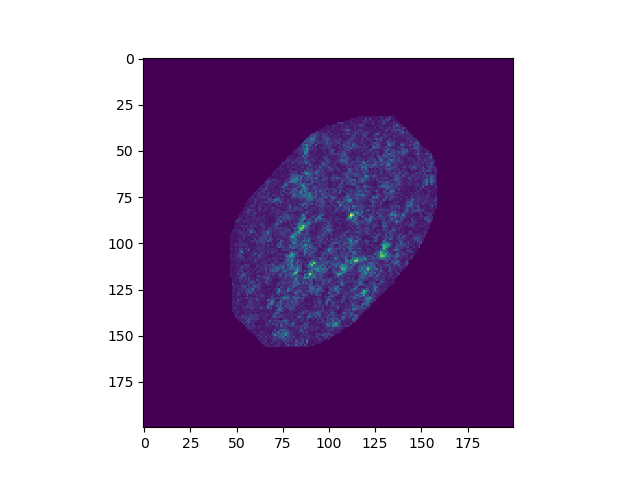

<IPython.core.display.Javascript object>

C:\ProgramData\Anaconda3_reinstalled\lib\site-packages\ipykernel_launcher.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  del sys.path[0]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


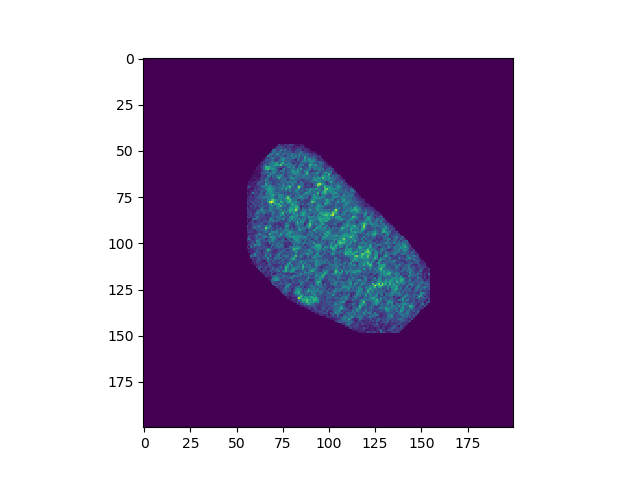

<IPython.core.display.Javascript object>


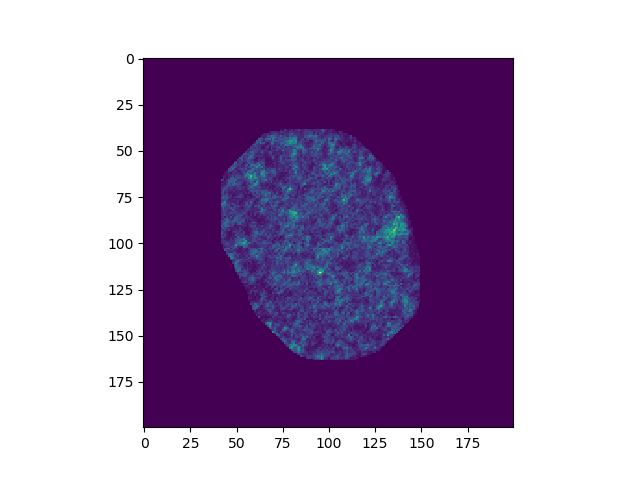

<IPython.core.display.Javascript object>


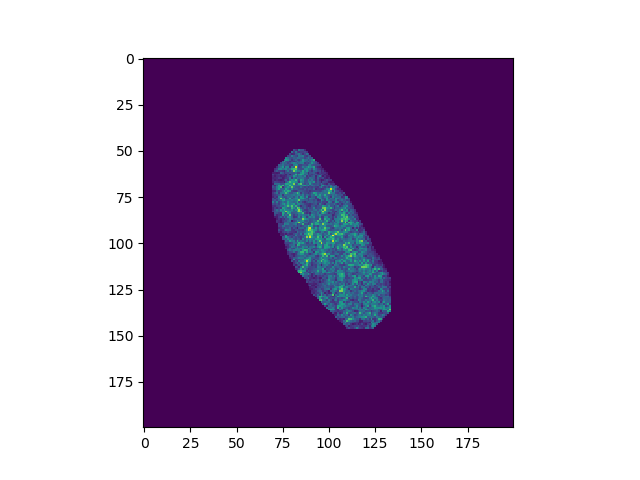

<IPython.core.display.Javascript object>


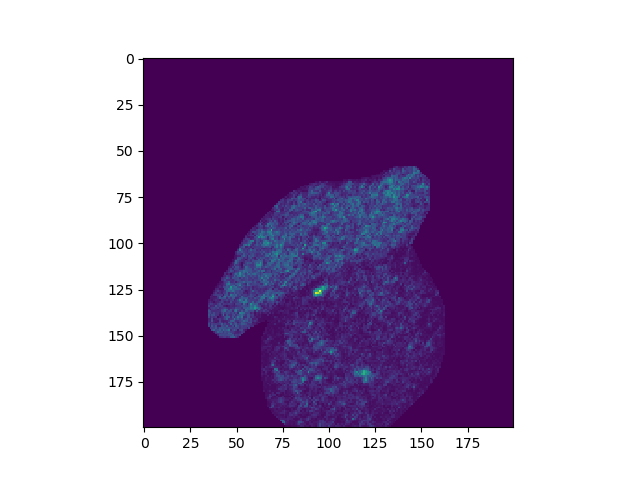

<IPython.core.display.Javascript object>


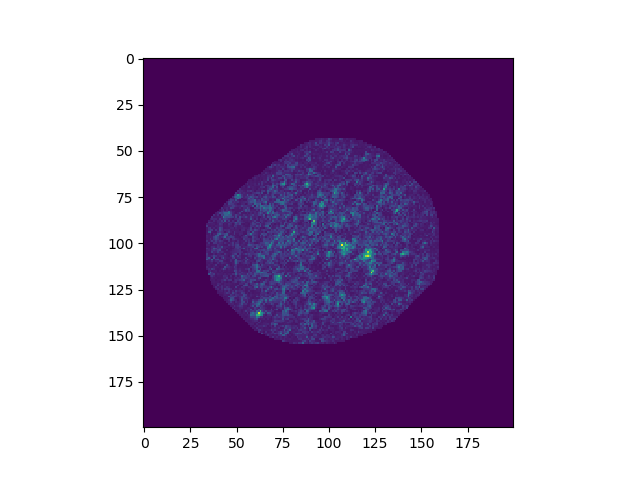

<IPython.core.display.Javascript object>


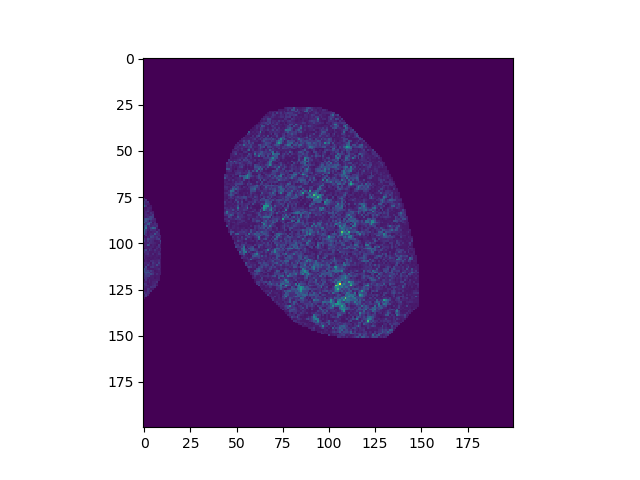

<IPython.core.display.Javascript object>


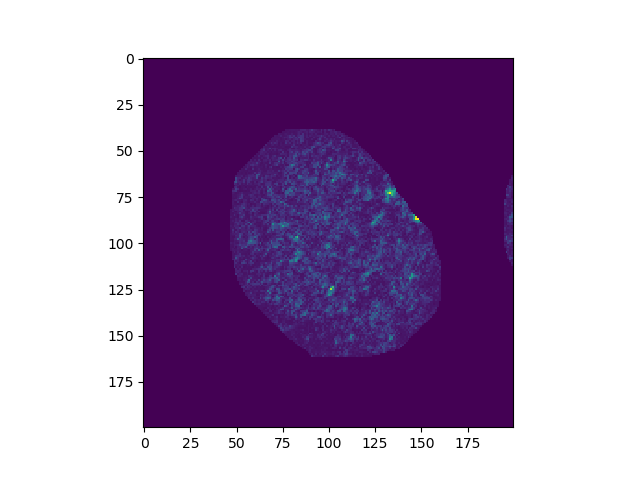

<IPython.core.display.Javascript object>


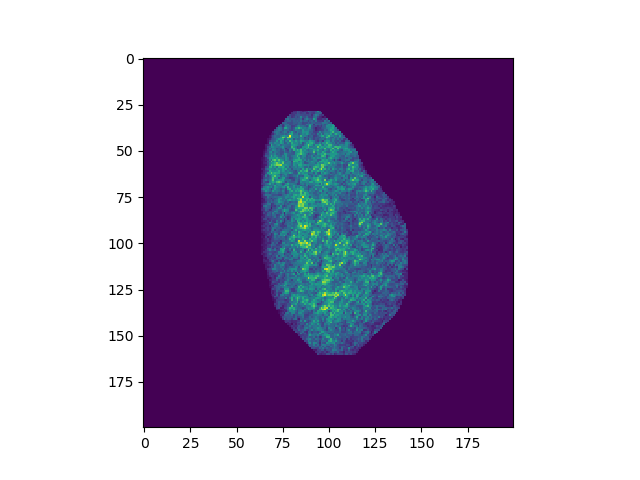

<IPython.core.display.Javascript object>


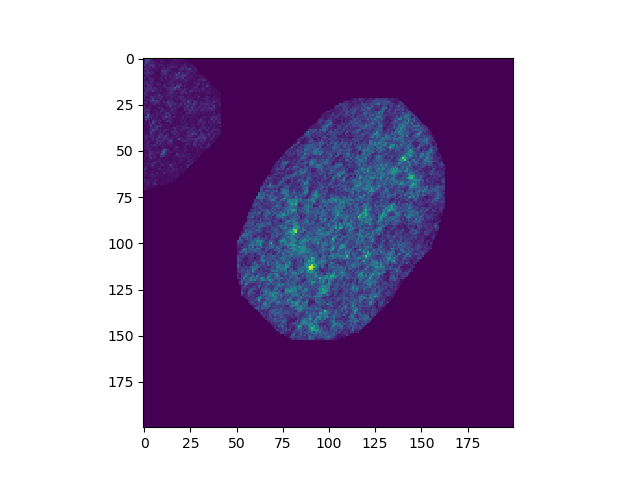

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


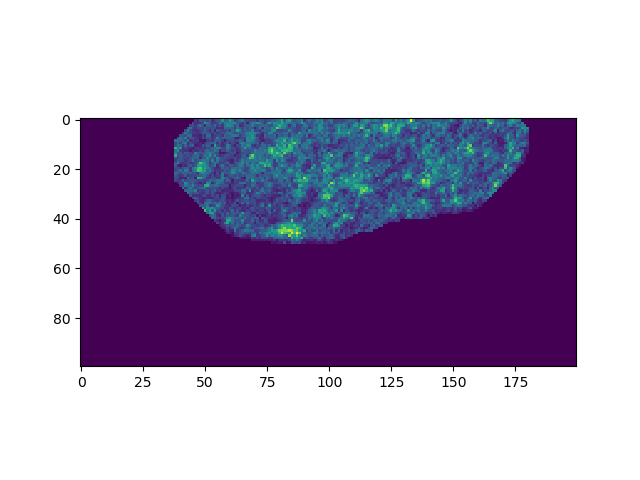

<IPython.core.display.Javascript object>


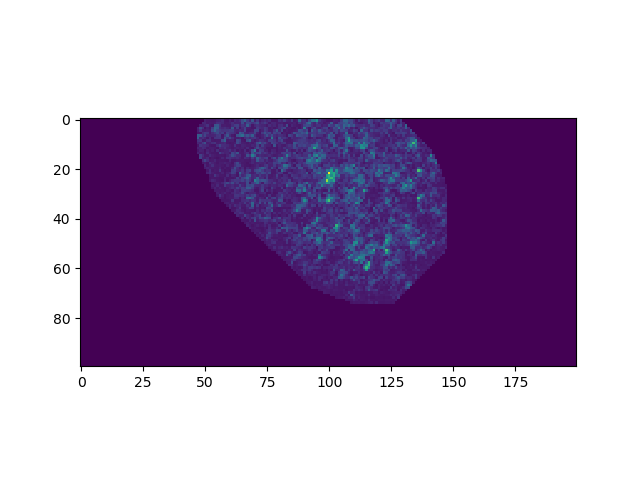

<IPython.core.display.Javascript object>


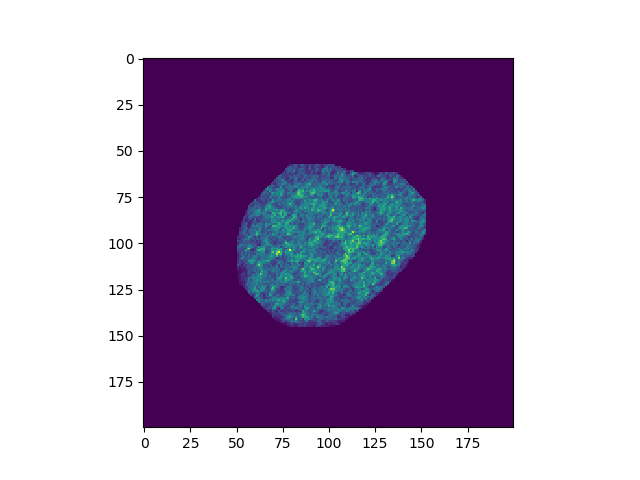

<IPython.core.display.Javascript object>


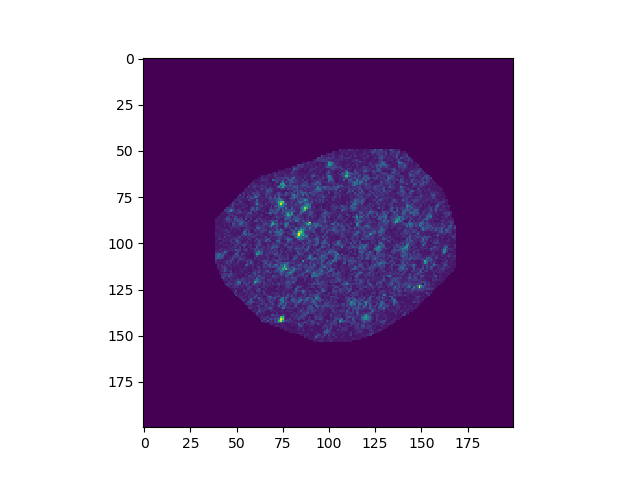

<IPython.core.display.Javascript object>


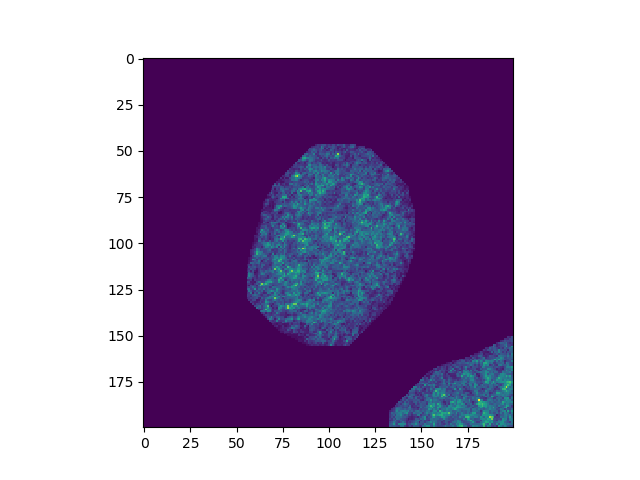

<IPython.core.display.Javascript object>


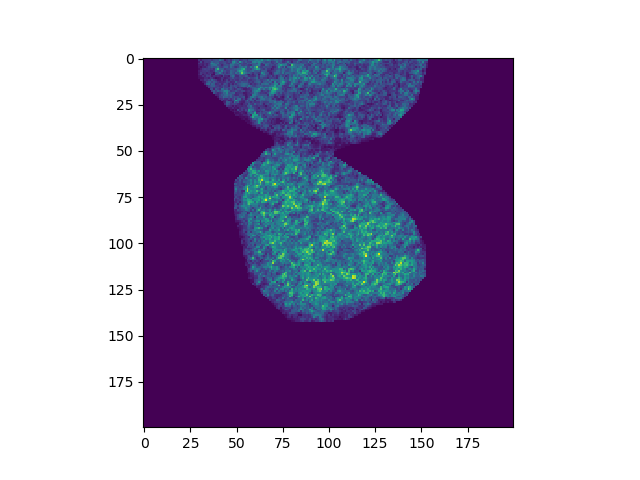

<IPython.core.display.Javascript object>


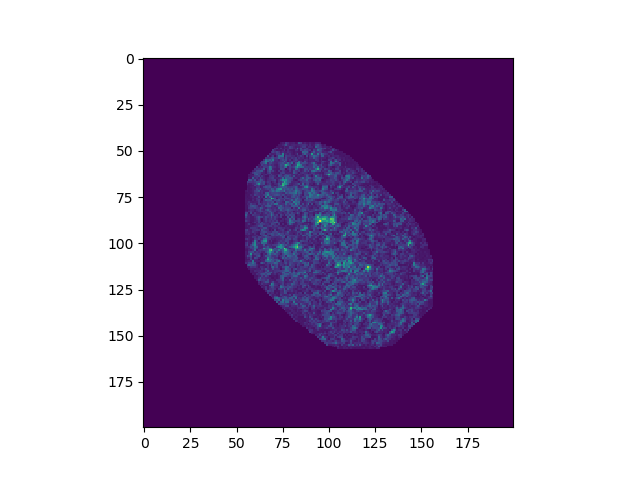

<IPython.core.display.Javascript object>


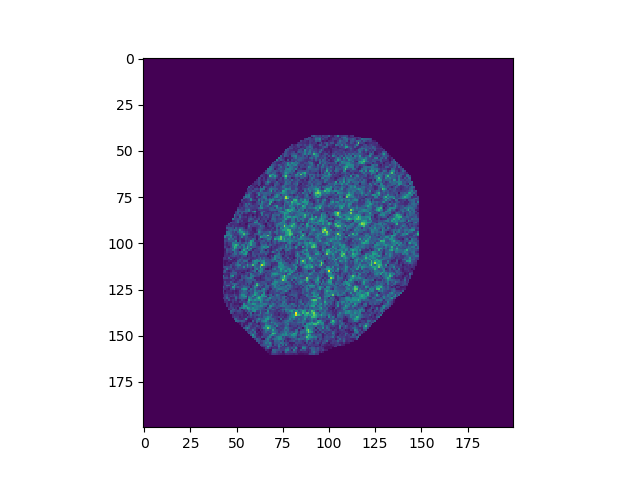

<IPython.core.display.Javascript object>


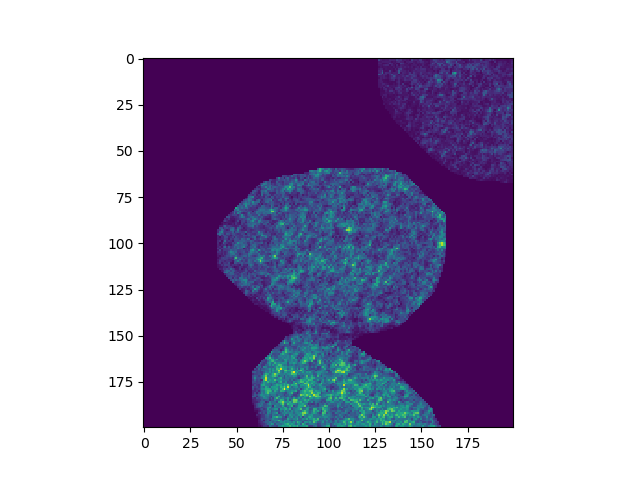

<IPython.core.display.Javascript object>


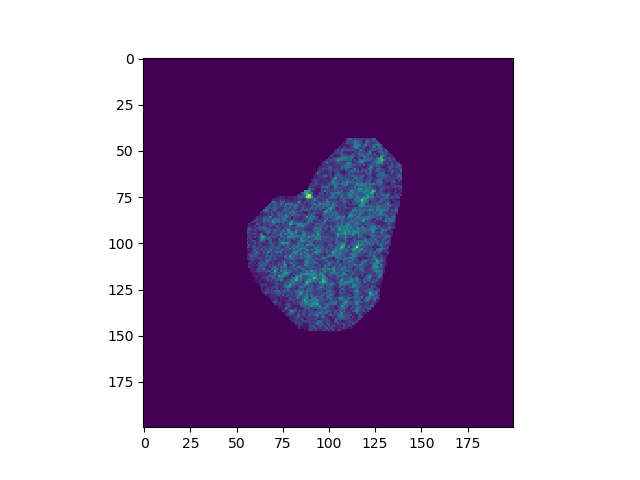

<IPython.core.display.Javascript object>


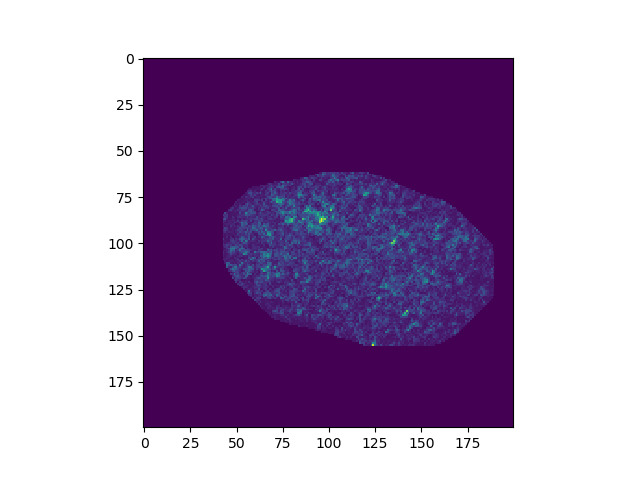

<IPython.core.display.Javascript object>


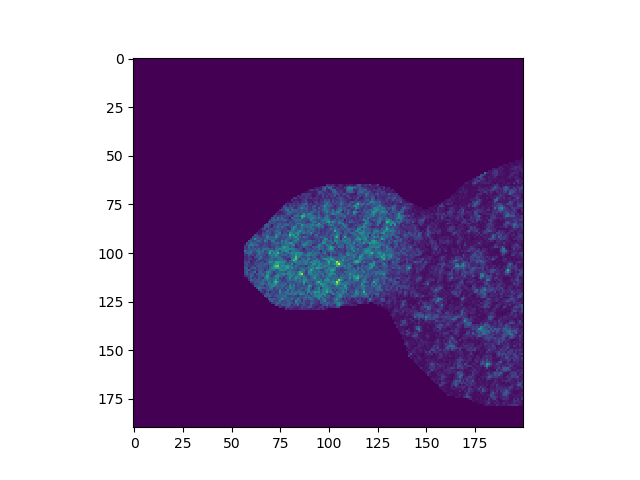

<IPython.core.display.Javascript object>


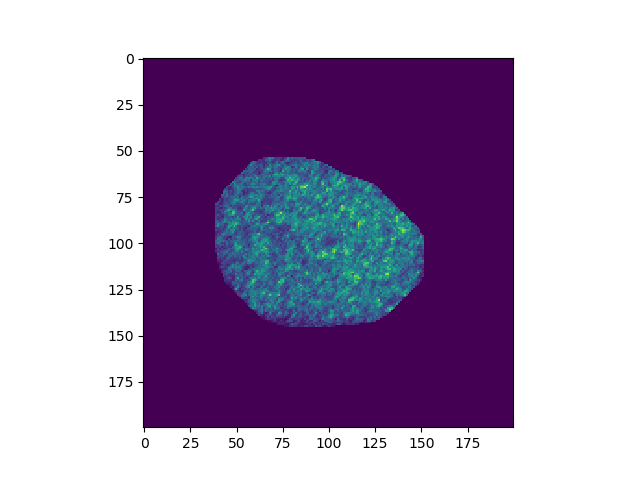

<IPython.core.display.Javascript object>


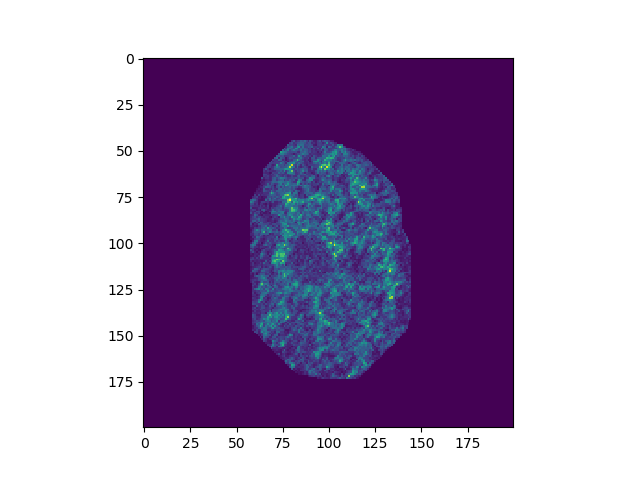

<IPython.core.display.Javascript object>


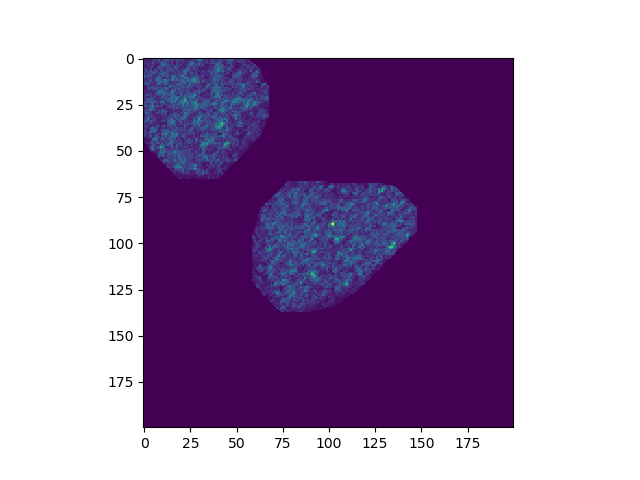

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


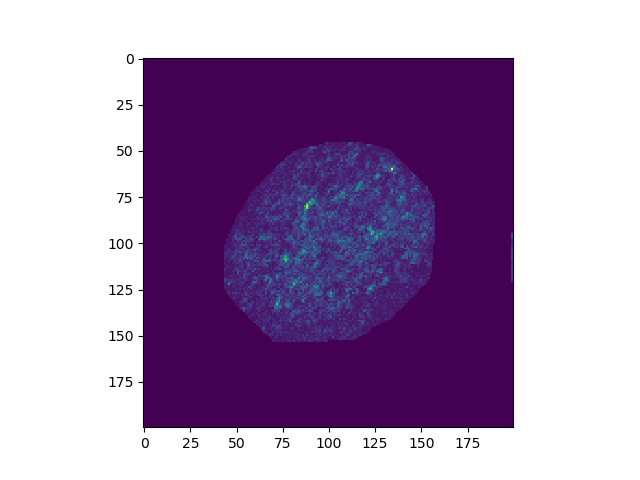

<IPython.core.display.Javascript object>


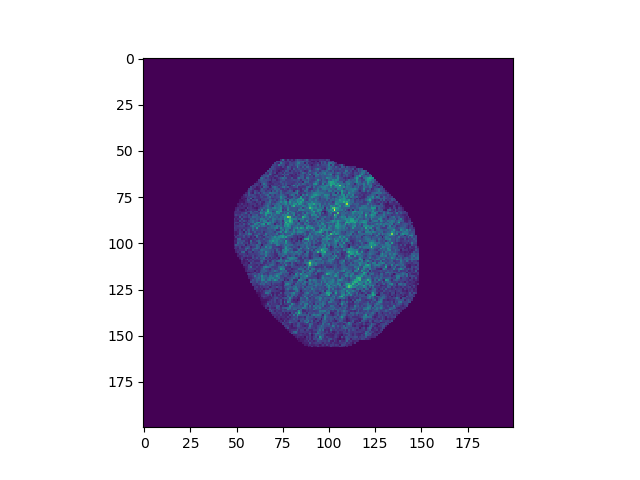

<IPython.core.display.Javascript object>


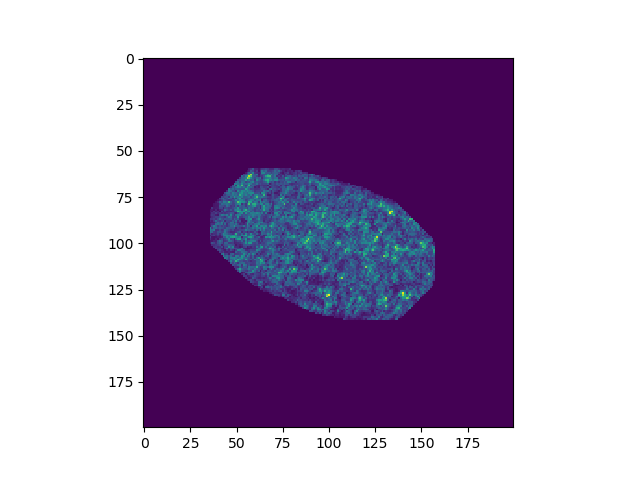

<IPython.core.display.Javascript object>


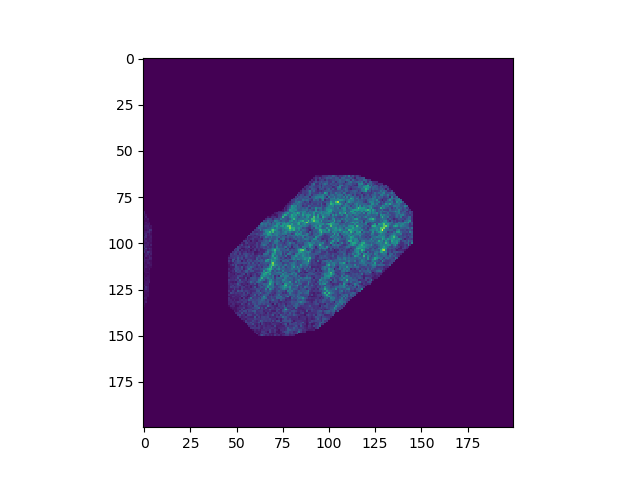

<IPython.core.display.Javascript object>


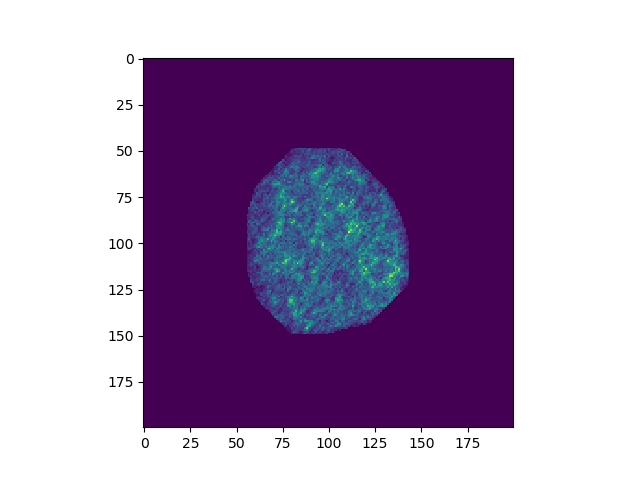

<IPython.core.display.Javascript object>


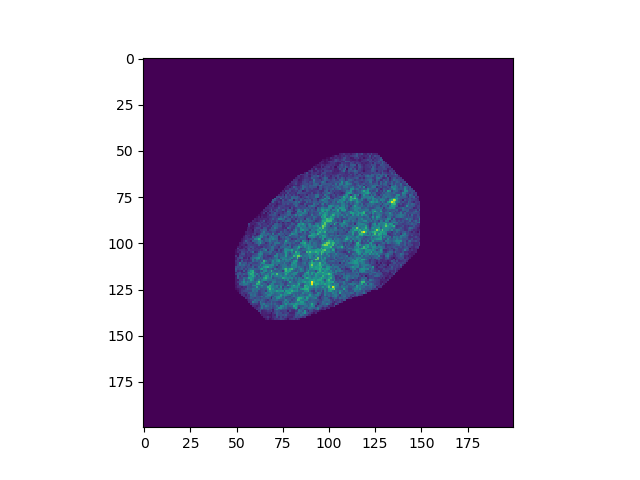

<IPython.core.display.Javascript object>


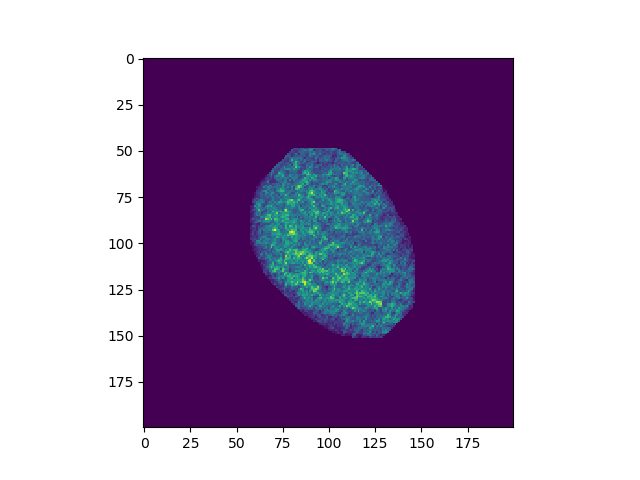

<IPython.core.display.Javascript object>


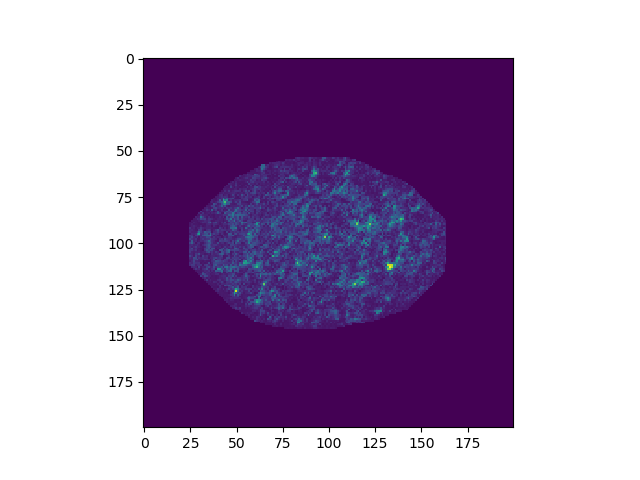

<IPython.core.display.Javascript object>


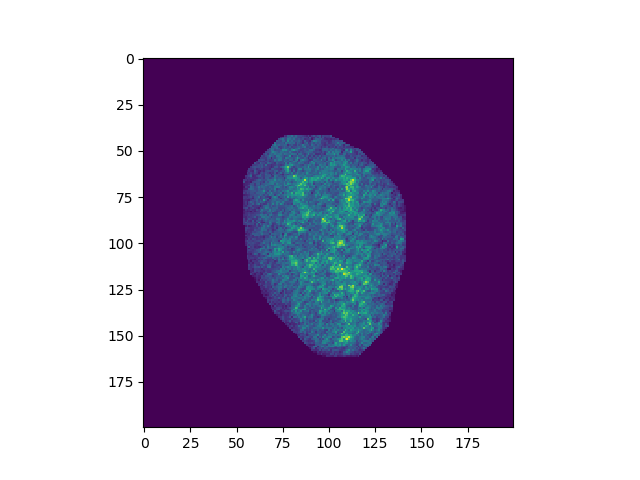

<IPython.core.display.Javascript object>


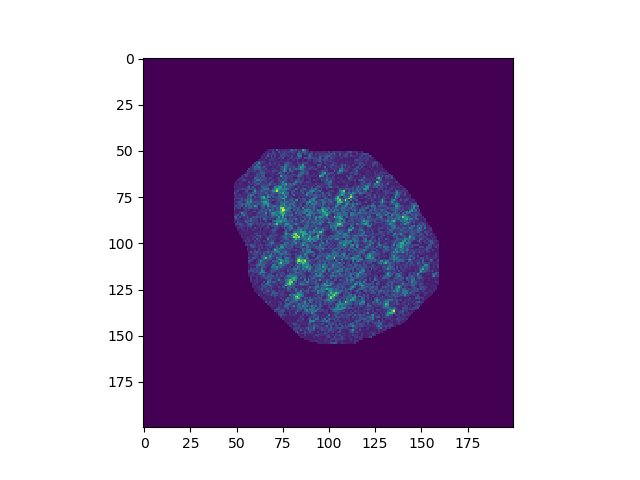

<IPython.core.display.Javascript object>


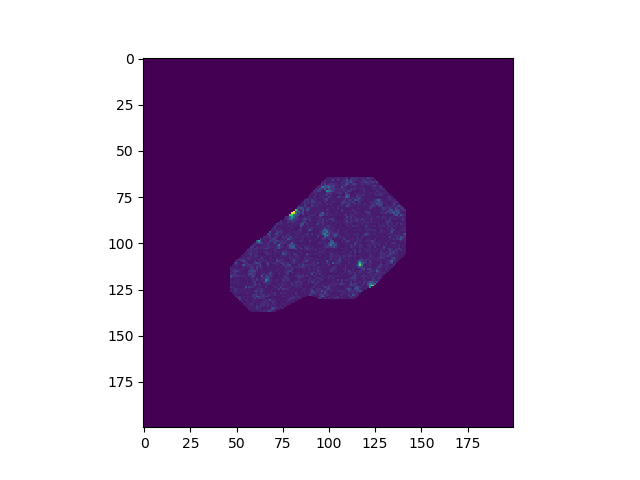

<IPython.core.display.Javascript object>


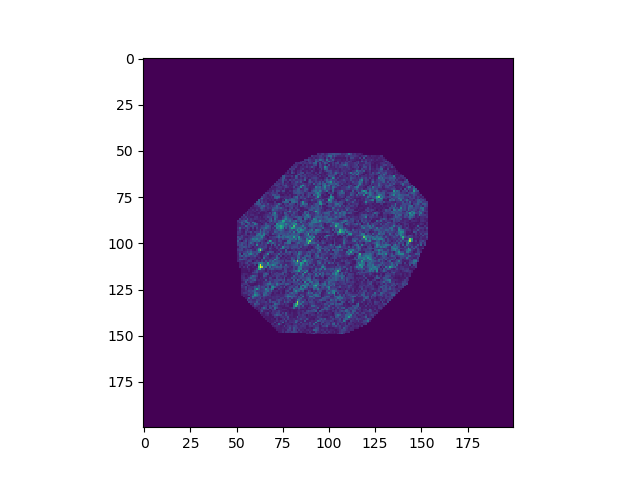

<IPython.core.display.Javascript object>


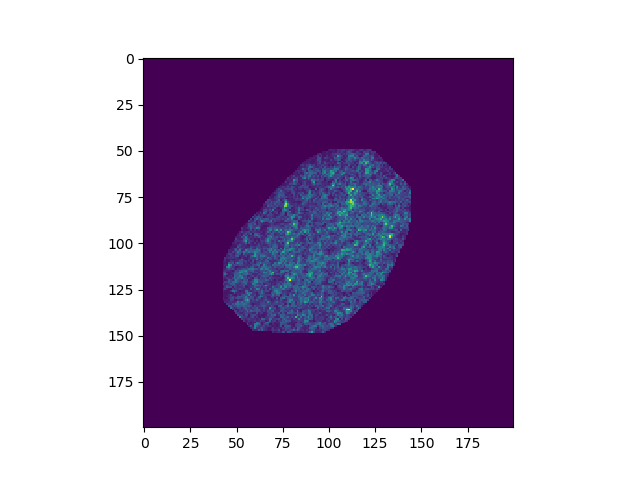

<IPython.core.display.Javascript object>


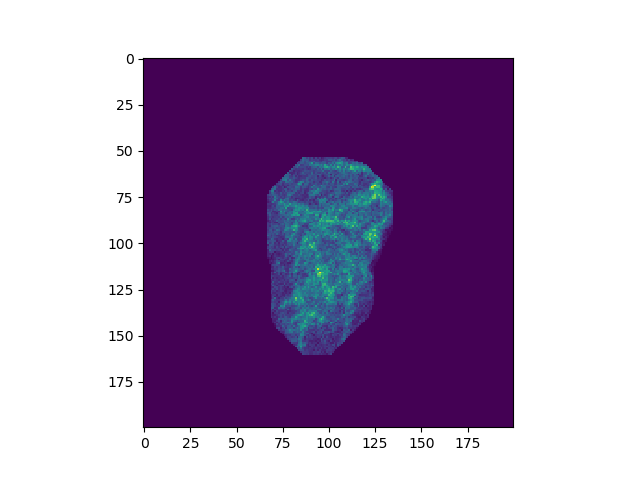

<IPython.core.display.Javascript object>


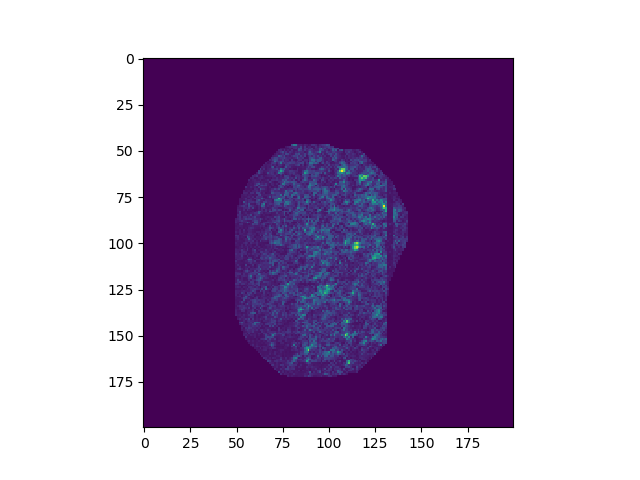

<IPython.core.display.Javascript object>


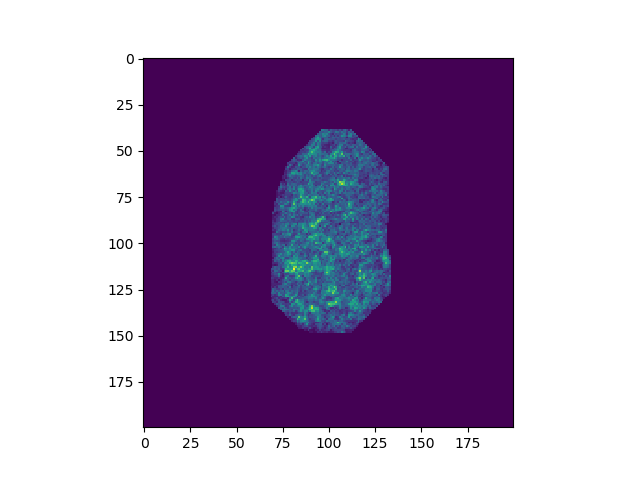

<IPython.core.display.Javascript object>


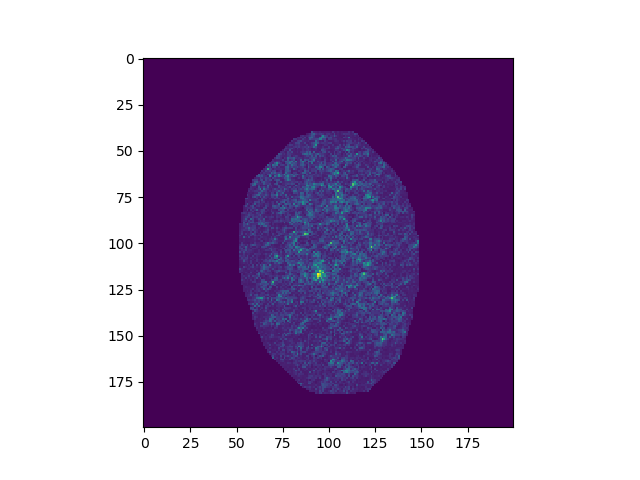

<IPython.core.display.Javascript object>


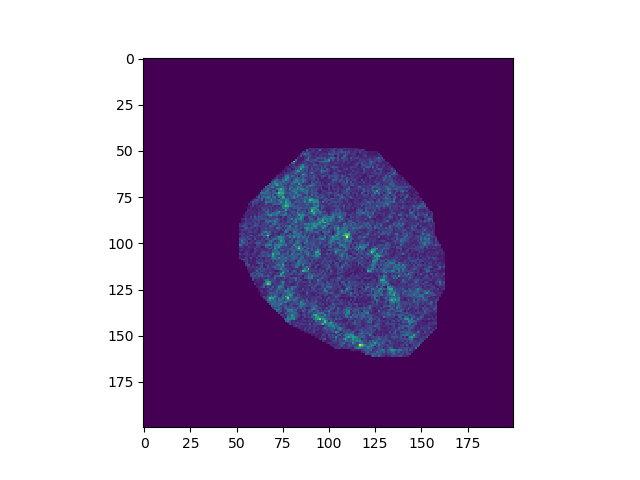

<IPython.core.display.Javascript object>


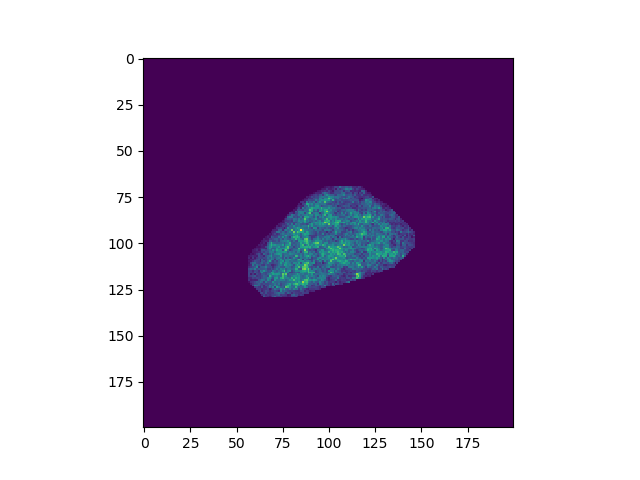

<IPython.core.display.Javascript object>


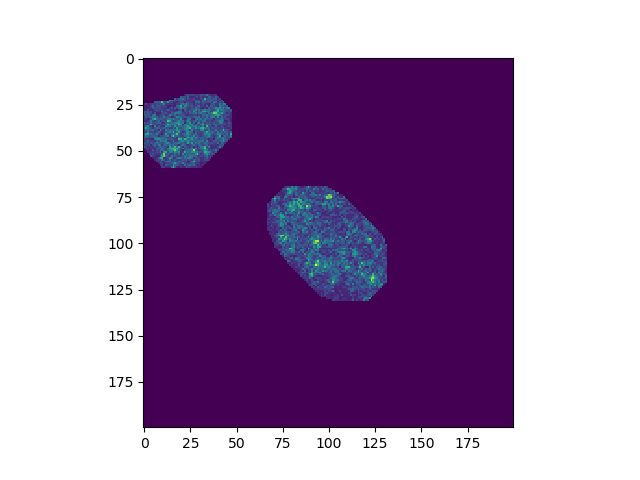

<IPython.core.display.Javascript object>


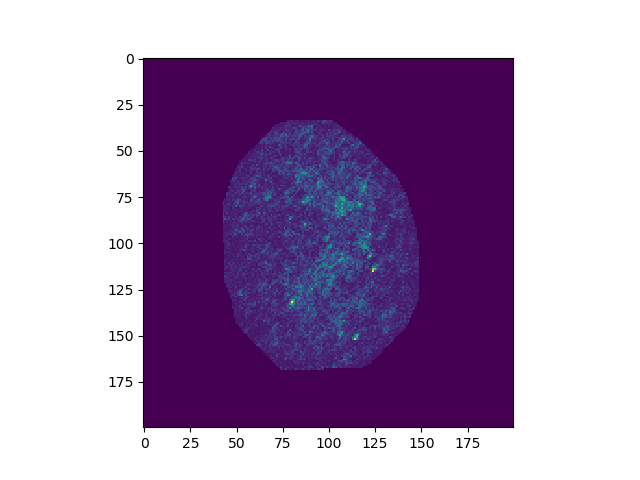

<IPython.core.display.Javascript object>


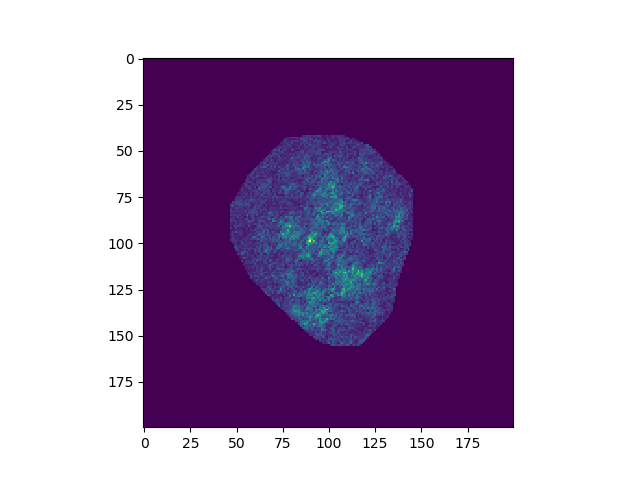

<IPython.core.display.Javascript object>


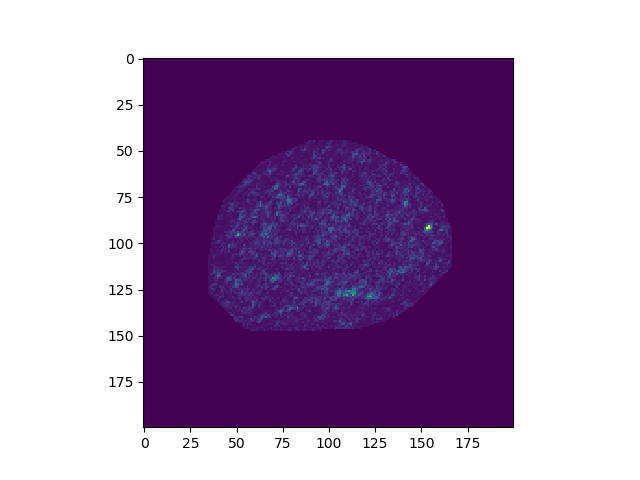

<IPython.core.display.Javascript object>


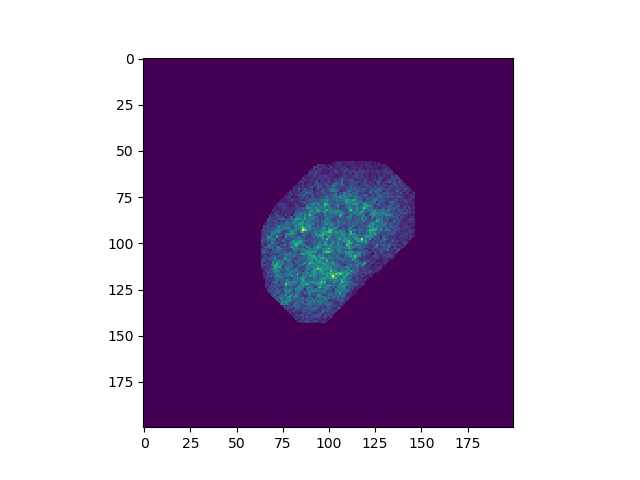

<IPython.core.display.Javascript object>


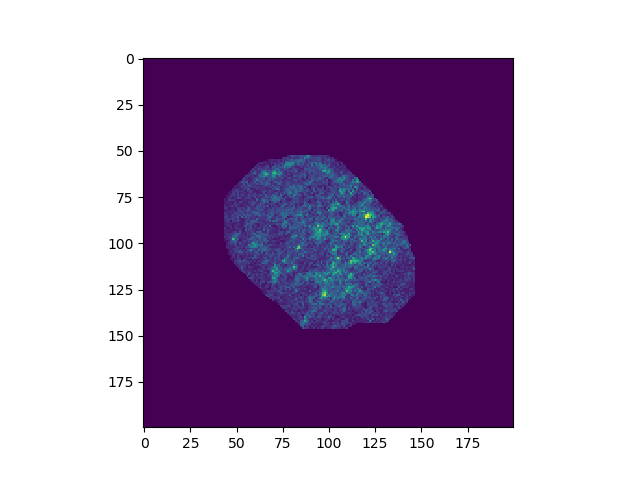

<IPython.core.display.Javascript object>


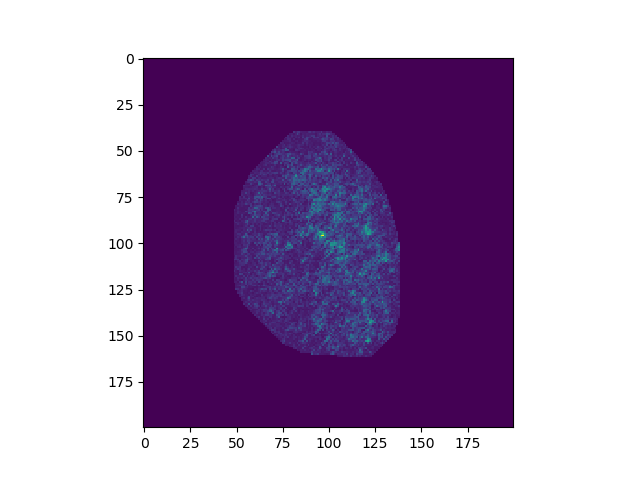

<IPython.core.display.Javascript object>


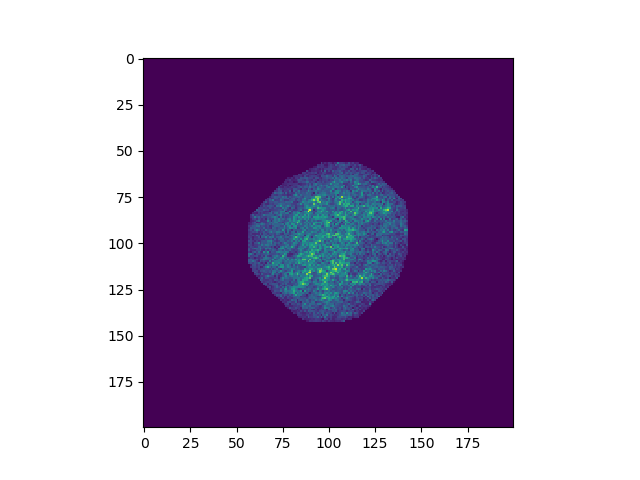

<IPython.core.display.Javascript object>


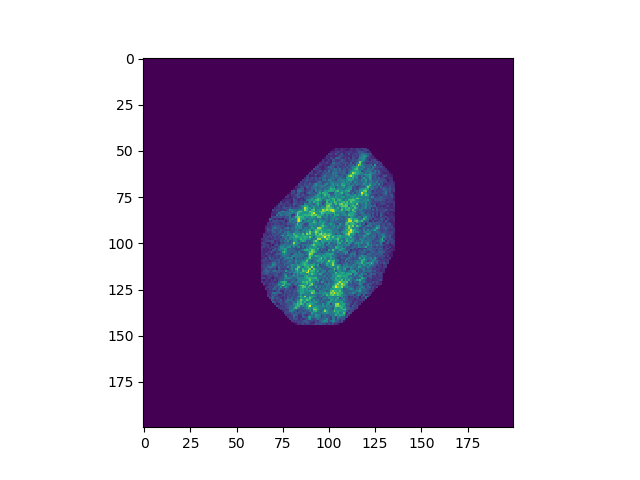

<IPython.core.display.Javascript object>


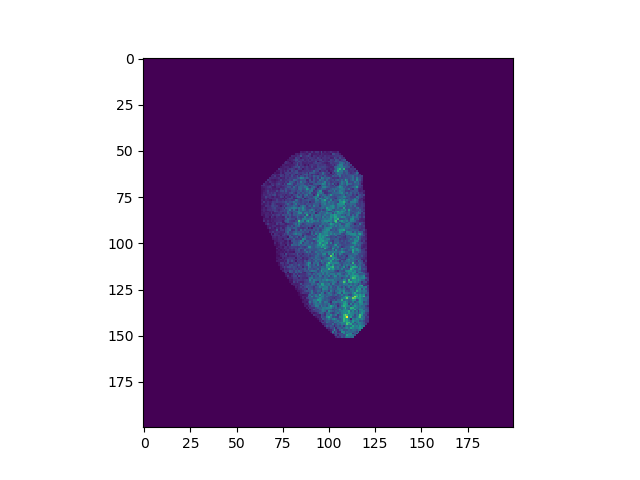

<IPython.core.display.Javascript object>


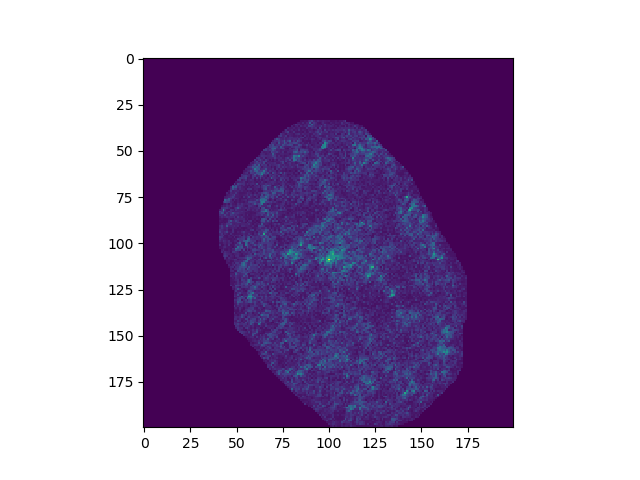

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


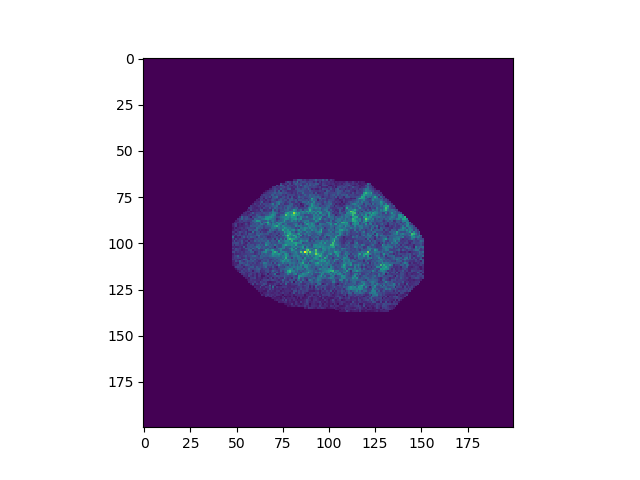

<IPython.core.display.Javascript object>


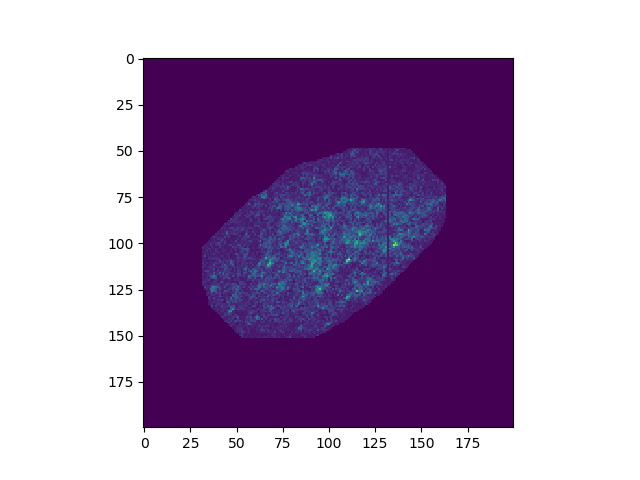

<IPython.core.display.Javascript object>


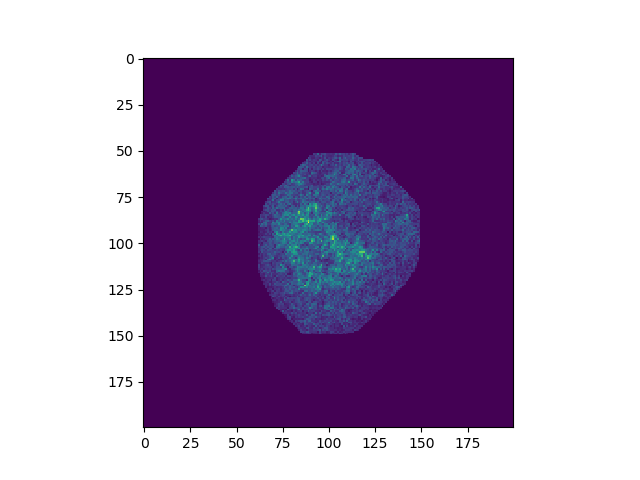

<IPython.core.display.Javascript object>


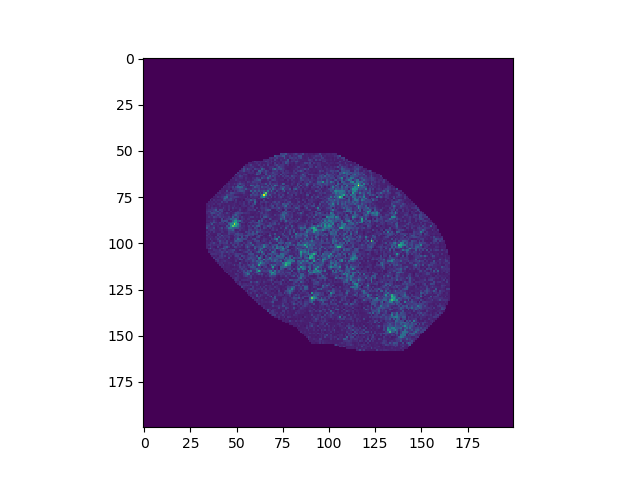

<IPython.core.display.Javascript object>


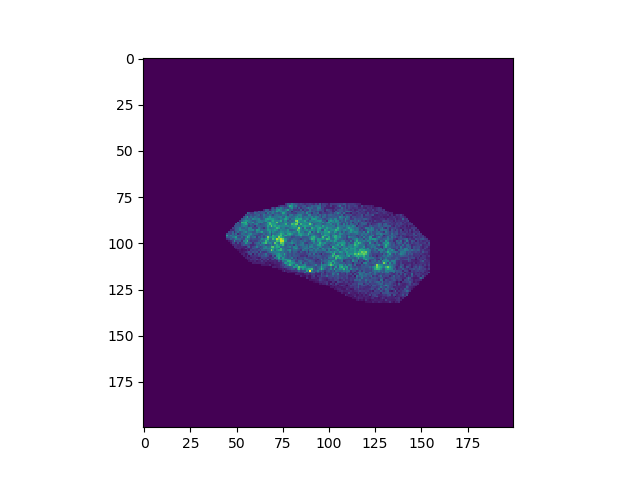

<IPython.core.display.Javascript object>


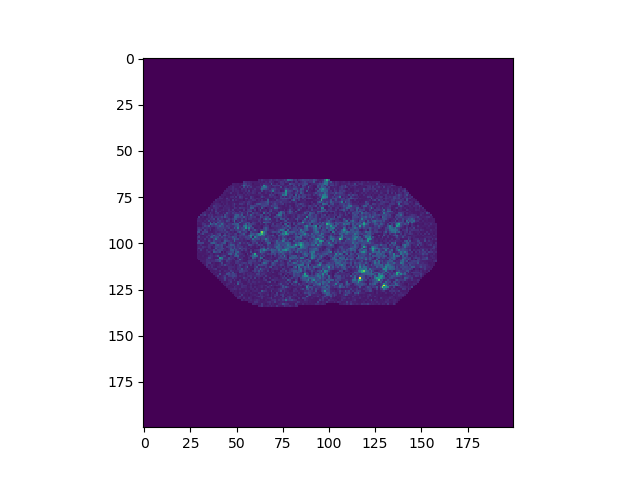

<IPython.core.display.Javascript object>


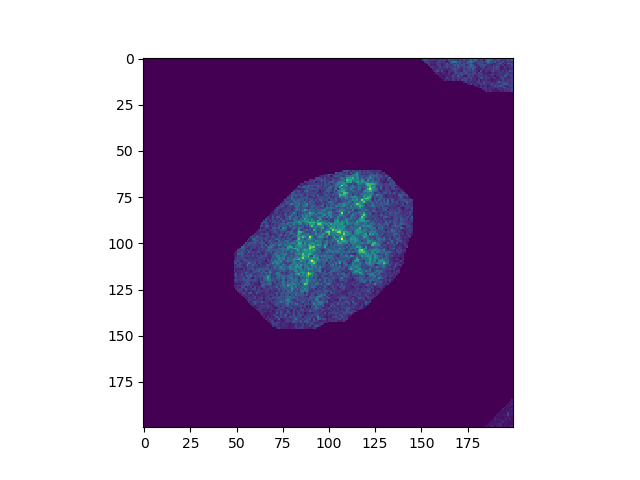

<IPython.core.display.Javascript object>


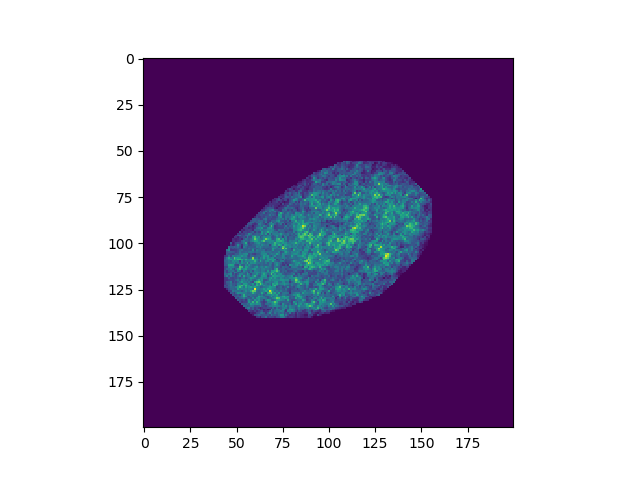

<IPython.core.display.Javascript object>


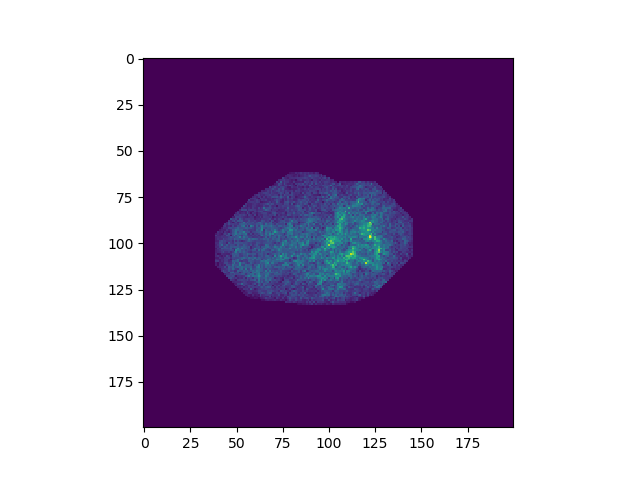

<IPython.core.display.Javascript object>


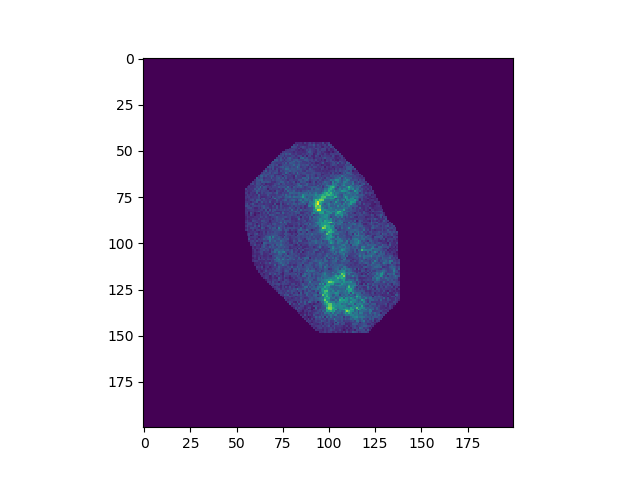

<IPython.core.display.Javascript object>


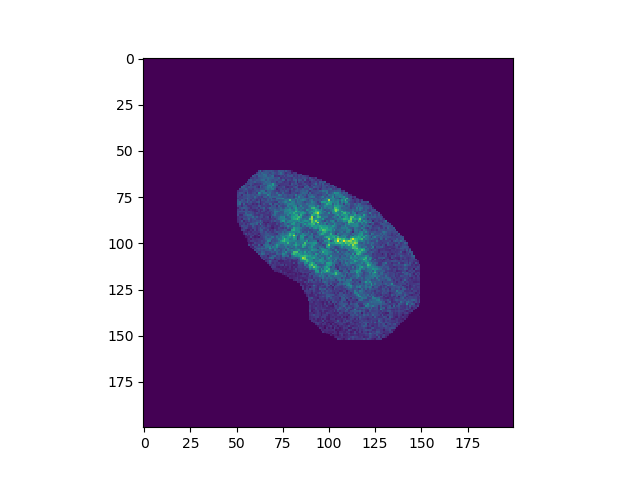

<IPython.core.display.Javascript object>


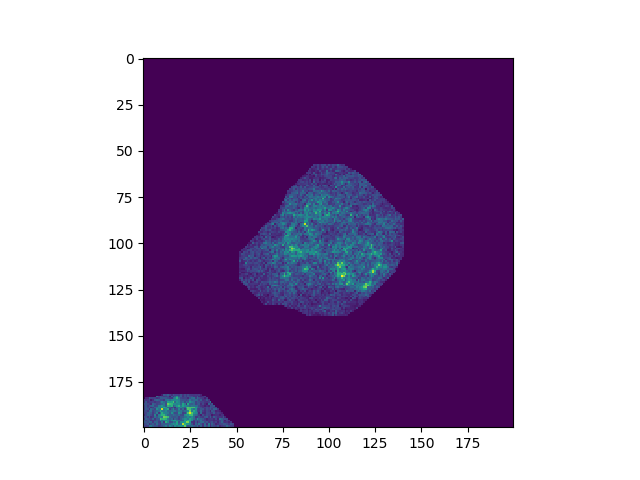

<IPython.core.display.Javascript object>


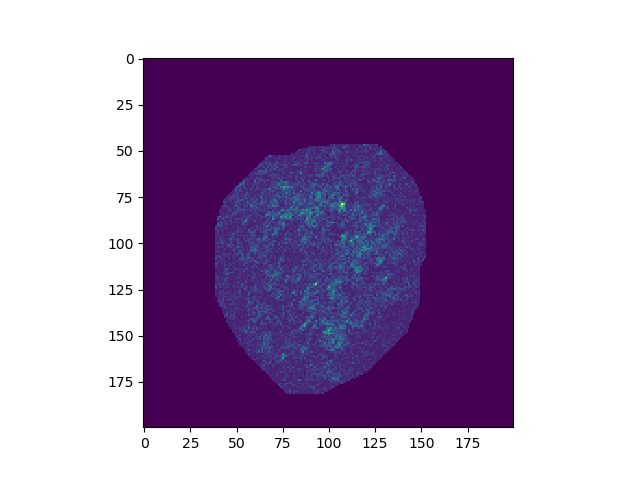

<IPython.core.display.Javascript object>


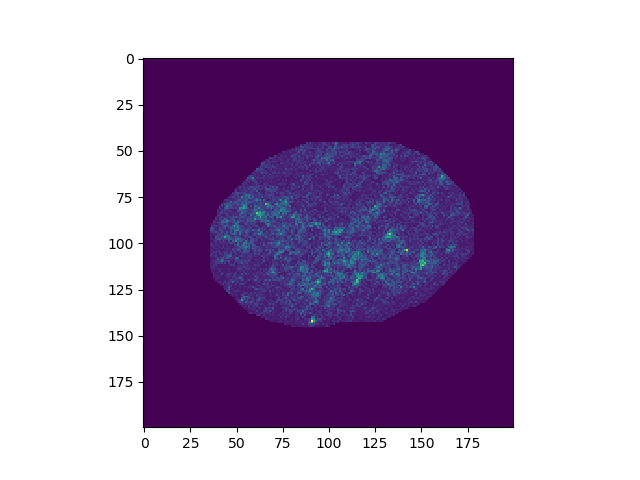

<IPython.core.display.Javascript object>


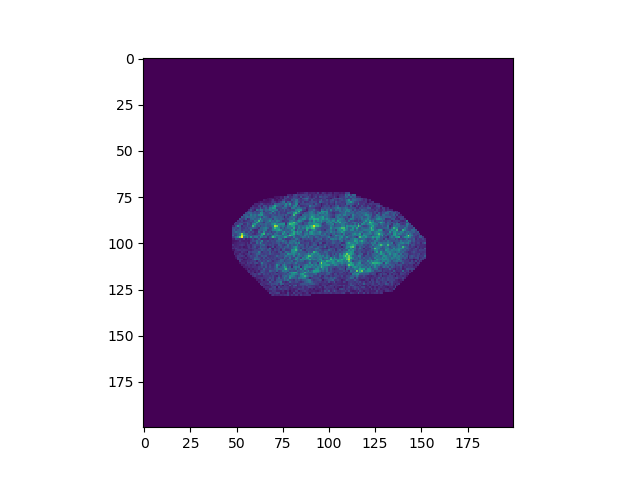

<IPython.core.display.Javascript object>


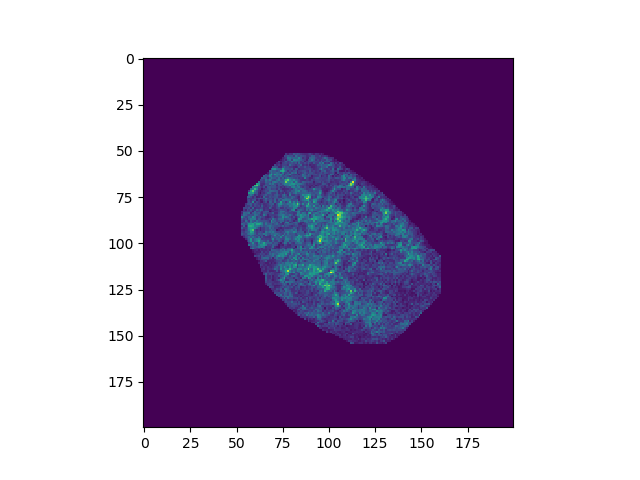

<IPython.core.display.Javascript object>


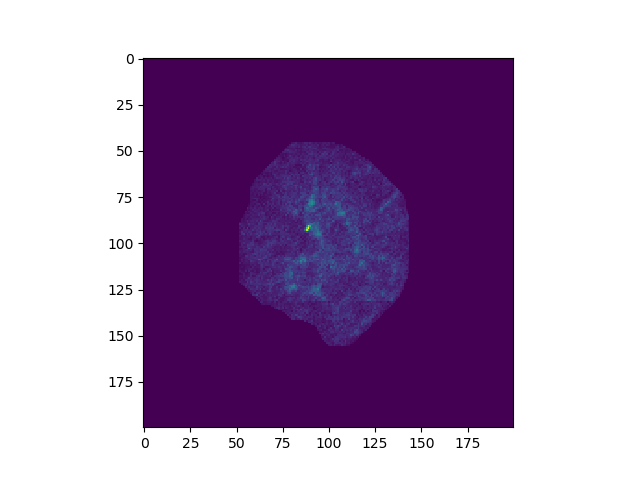

In [25]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

def process(filename: str=None) -> None:
    """
    View multiple images stored in files, stacking vertically

    Arguments:
        filename: str - path to filename containing image
    """
    image = mpimg.imread(filename)
    # <something gets done here>
    plt.figure()
    plt.imshow(image)

for file in onlyfiles:
    filePath=f'{path}\\{file}'
    process(filePath)